# Load Data

In [ ]:
# download libraries
!pip install -q datasets wordcloud nltk torch-geometric
!pip install -q sentence-transformers
!pip install -q tensorboard networkx

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 36.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 51.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 13.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 15.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 20.1 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


In [ ]:
import os
import re
import time
import nltk
import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from torch import nn
import torch.nn.functional as F
from torch.utils.tensorboard import SummaryWriter
from sklearn.metrics import (precision_recall_fscore_support, accuracy_score, confusion_matrix, ConfusionMatrixDisplay)
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from google.colab import drive
from datasets import load_dataset
from sentence_transformers import SentenceTransformer
from torch_geometric.data import HeteroData
from torch_geometric.nn import (SAGEConv, GatedGraphConv, GCNConv, GINConv)
import networkx as nx



In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp -r /content/drive/My\ Drive/ANN/runs ./

In [ ]:
# load the reddit dataset from HuggingFace repositories
ds = load_dataset(
    "webis/tldr-17",
    trust_remote_code=True,
    split="train[:100%]",)

README.md:   0%|          | 0.00/9.14k [00:00<?, ?B/s]

tldr-17.py:   0%|          | 0.00/4.33k [00:00<?, ?B/s]

dataset_infos.json:   0%|          | 0.00/2.79k [00:00<?, ?B/s]

corpus-webis-tldr-17.zip:   0%|          | 0.00/3.14G [00:00<?, ?B/s]

Generating train split:   0%|          | 0/3848330 [00:00<?, ? examples/s]

Loading dataset shards:   0%|          | 0/38 [00:00<?, ?it/s]

In [ ]:
print(ds)

Dataset({
    features: ['author', 'body', 'normalizedBody', 'subreddit', 'subreddit_id', 'id', 'content', 'summary'],
    num_rows: 3848330
})


In [ ]:
# convert the HuggingFace dataset to pandas for easier use
df = ds.to_pandas()

In [ ]:
df.head()

,author,body,normalizedBody,subreddit,subreddit_id,id,content,summary
0,raysofdarkmatter,I think it should be fixed on either UTC stand...,I think it should be fixed on either UTC stand...,math,t5_2qh0n,c69al3r,I think it should be fixed on either UTC stand...,Shifting seasonal time is no longer worth it.
1,Stork13,Art is about the hardest thing to categorize i...,Art is about the hardest thing to categorize i...,funny,t5_2qh33,c6a9nxd,Art is about the hardest thing to categorize i...,Personal opinions 'n shit.
2,Cloud_dreamer,Ask me what I think about the Wall Street Jour...,Ask me what I think about the Wall Street Jour...,Borderlands,t5_2r8cd,c6acx4l,Ask me what I think about the Wall Street Jour...,insults and slack ass insight. \n Wall Street ...
3,NightlyReaper,"In Mechwarrior Online, I have begun to use a m...","In Mechwarrior Online, I have begun to use a m...",gamingpc,t5_2sq2y,c8onqew,"In Mechwarrior Online, I have begun to use a m...","Yes, Joysticks in modern games have apparently..."
4,NuffZetPand0ra,"You are talking about the Charsi imbue, right?...","You are talking about the Charsi imbue, right?...",Diablo,t5_2qore,c6acxvc,"You are talking about the Charsi imbue, right?...",Class only items dropped from high-lvl monsters.


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3848330 entries, 0 to 3848329
Data columns (total 8 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   author          object
 1   body            object
 2   normalizedBody  object
 3   subreddit       object
 4   subreddit_id    object
 5   id              object
 6   content         object
 7   summary         object
dtypes: object(8)
memory usage: 234.9+ MB


In [ ]:
# enable detaild error messages
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

# Clean Data

## Pick Top 3 Subreddits

In [ ]:
# pick top 3 subreddits to work on them
subreddit_counts = df['subreddit'].value_counts()
top_3_subreddits = subreddit_counts.nlargest(3).index
filtered_df = df[df['subreddit'].isin(top_3_subreddits)]
df = filtered_df.reset_index(drop=True)

num_classes = len(df['subreddit'].unique())

In [ ]:
df['subreddit'].unique()

array(['AskReddit', 'leagueoflegends', 'relationships'], dtype=object)

In [ ]:
df['subreddit'].value_counts()

,count
subreddit,
AskReddit,589947
relationships,352049
leagueoflegends,109307


In [ ]:
# downsample the data
min_count = df['subreddit'].value_counts().min()
df = (
    df.groupby('subreddit')
    .apply(lambda x: x.sample(n=min_count, random_state=42))  # sample 'min_count' rows
    .reset_index(drop=True)
)

print(df['subreddit'].value_counts())

subreddit
AskReddit          109307
leagueoflegends    109307
relationships      109307
Name: count, dtype: int64


<ipython-input-14-29be3666c498>:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(n=min_count, random_state=42))  # sample 'min_count' rows


In [ ]:
df['subreddit'].value_counts()

,count
subreddit,
AskReddit,109307
leagueoflegends,109307
relationships,109307


## Content Text Cleaning

In [ ]:
# download stopwords
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
# load stopwords
stop_words = nltk.corpus.stopwords.words('english')

def clean_text(text):
  # remove words that contain digits
  text = re.sub(r'\b\w*\d\w*\b', ' ', text)

  # replace any character that is not a word character with space
#   text = re.sub(r'[^\w\s]', ' ', text)

  # remove single-character words
#   text = re.sub(r'\b[a-zA-Z]\b', ' ', text)

  # replace multiple consecutive spaces with a single space and strip trailing spaces
  text = re.sub(r'\s+', ' ', text).strip()

  # remove stopwords
  text = ' '.join([word for word in text.split() if word.lower() not in stop_words])

  return text.lower()


In [ ]:
df["content"] = df["content"].apply(clean_text) # clean content feature

## Content Text Embedding



In [ ]:
# use Microsoft's all-MiniLM-L6-v2 model for text embedding
model = SentenceTransformer('all-MiniLM-L6-v2')
model = model.to('cuda')
embeddings = model.encode(df['content'].tolist(), device='cuda')

print("Embeddings shape:", embeddings.shape)

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Embeddings shape: (327921, 384)


In [ ]:
df['content'] = list(embeddings)

## Label Encoding


In [ ]:
# encode subreddits
subreddit_econder = LabelEncoder()
df['subreddit'] = subreddit_econder.fit_transform(df['subreddit'])

In [ ]:
# encode authors
author_encoder = LabelEncoder()
df['author'] = author_encoder.fit_transform(df['author'])

In [ ]:
# encode post ids
post_id_encoder = LabelEncoder()
df['id'] = post_id_encoder.fit_transform(df['id'])

## Remove Irrelevant Features

In [ ]:
df.drop(columns=[
    'normalizedBody',
    'subreddit_id',
    'body',
    'summary'], inplace=True)

## Save Dataframe

In [ ]:
# df.to_csv('cleaned_df.csv', index=False)
# !cp -r ./cleaned_df.csv /content/drive/My\ Drive/ANN

# Construct Heterogeneous Graph

In [ ]:
def create_post_similarity_edges(post_embeddings, threshold=0.7, batch_size=1024):
    post_embeddings = F.normalize(post_embeddings, p=2, dim=1)

    num_posts = post_embeddings.size(0)
    sources = []
    targets = []
    similarities = []

    # process embeddings in batches
    for i in range(0, num_posts, batch_size):
        batch = post_embeddings[i:i + batch_size]

        # compute cosine similarity of batch
        similarity_matrix = torch.matmul(batch, post_embeddings.T)  # shape: [batch_size, num_posts]

        # find indices where similarity > threshold
        batch_sources, batch_targets = torch.where(similarity_matrix > threshold)

        # adjust indices for the current batch
        batch_sources = batch_sources + i

        # remove self-loops
        mask = batch_sources != batch_targets
        batch_sources = batch_sources[mask]
        batch_targets = batch_targets[mask]
        batch_similarities = similarity_matrix[batch_sources - i, batch_targets]  # Gather similarity scores

        # append results
        sources.append(batch_sources)
        targets.append(batch_targets)
        similarities.append(batch_similarities)

    # concatenate results
    sources = torch.cat(sources, dim=0)
    targets = torch.cat(targets, dim=0)
    similarities = torch.cat(similarities, dim=0)

    # create edge index and edge attributes
    device = post_embeddings.device
    edge_index = torch.stack([sources, targets], dim=0).to(device)
    edge_attr = similarities.to(device)

    return edge_index, edge_attr


In [ ]:
data = HeteroData()

# post nodes
# data['post'].x = torch.tensor(df['content'], dtype=torch.float)
data['post'].x = torch.tensor(np.array(df['content'].tolist()), dtype=torch.float) # works faster than the former line
data['post'].y = torch.tensor(np.array(df['subreddit'].tolist()), dtype=torch.long)

# author nodes
num_authors = df['author'].nunique()
data['author'].x = torch.zeros((num_authors, 1))

# author to post edges
author_to_post_edges = torch.tensor(
    np.array([df['author'].tolist(), df['id'].tolist()]),
    dtype=torch.long
)
data['author', 'writes', 'post'].edge_index = author_to_post_edges

# post similarity edges & weights
post_content_tensor = torch.tensor(np.array(df['content'].tolist()), dtype=torch.float32)
post_similarity_edges, post_similarity_scores = create_post_similarity_edges(
    post_content_tensor, threshold=0.9
)

data['post', 'similar_to', 'post'].edge_index = post_similarity_edges
data['post', 'similar_to', 'post'].edge_attr = post_similarity_scores  # similarity scores as edge attributes


print(data)

HeteroData(
  post={
    x=[327921, 384],
    y=[327921],
  },
  author={ x=[207579, 1] },
  (author, writes, post)={ edge_index=[2, 327921] },
  (post, similar_to, post)={
    edge_index=[2, 21470],
    edge_attr=[21470],
  }
)


# Visualize Data Graph

In [ ]:
def create_post_similarity_edges(post_embeddings, threshold=0.7):
    post_embeddings = F.normalize(post_embeddings, p=2, dim=1)
    num_posts = post_embeddings.size(0)
    edges = []

    similarity_matrix = torch.matmul(post_embeddings, post_embeddings.T)  # shape: [num_posts, num_posts]

    # find indices where similarity > threshold
    sources, targets = torch.where(similarity_matrix > threshold)

    # remove self-loops
    mask = sources != targets
    sources = sources[mask]
    targets = targets[mask]

    # add edges
    for src, tgt in zip(sources.tolist(), targets.tolist()):
        similarity = similarity_matrix[src, tgt].item()
        edges.append((src, tgt, similarity))

    return edges

In [ ]:
G = nx.Graph()

tmp_df = df[:15]
# add nodes for authors and posts
for author in tmp_df['author'].unique():
    G.add_node(f'author_{author}', type='author')

for post_id in tmp_df['id']:
    G.add_node(f'post_{post_id}', type='post')

# add edges between authors and posts
for _, row in tmp_df.iterrows():
    G.add_edge(f'author_{row["author"]}', f'post_{row["id"]}', relation='writes')

# create edges between posts based on content similarity
content_tensor = torch.tensor(np.array(tmp_df['content'].tolist()), dtype=torch.float32)
similarity_edges = create_post_similarity_edges(content_tensor, threshold=0.2)

for src, tgt, similarity in similarity_edges:
    post_src = f'post_{tmp_df.iloc[src]["id"]}'
    post_tgt = f'post_{tmp_df.iloc[tgt]["id"]}'
    G.add_edge(post_src, post_tgt, relation='similar_to', similarity=similarity)

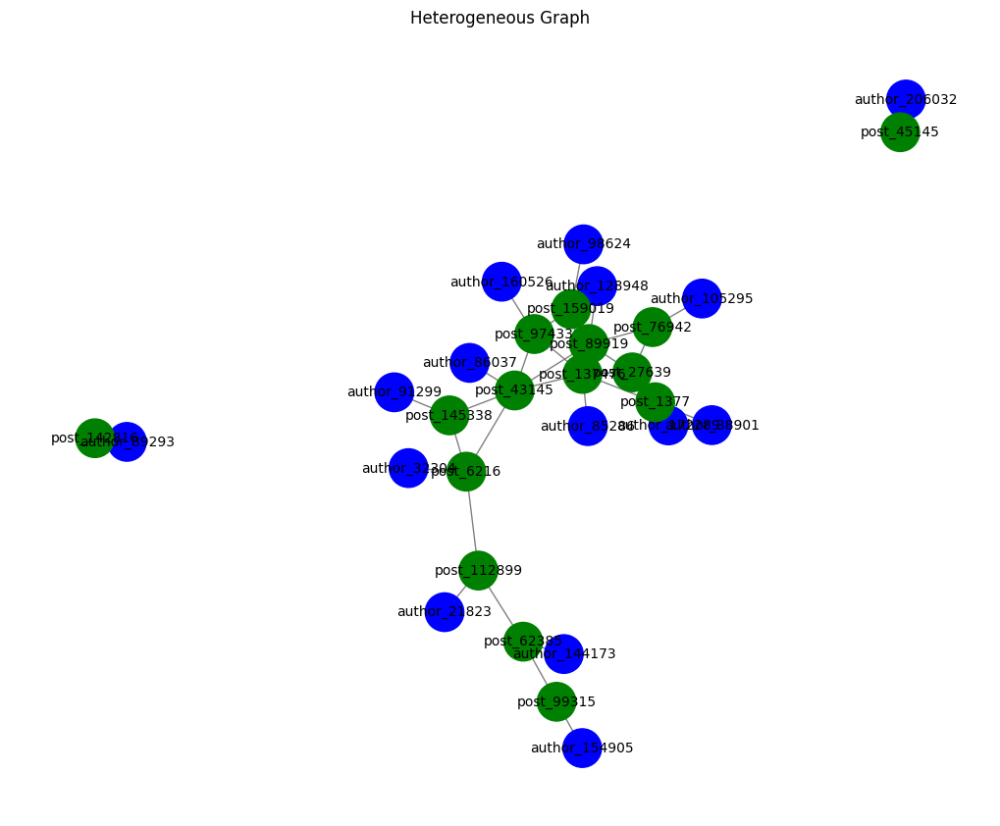

In [ ]:
# specify position and colors
pos = nx.spring_layout(G)
node_colors = ['blue' if G.nodes[node]['type'] == 'author' else 'green' for node in G.nodes]

# draw the graph
plt.figure(figsize=(10, 8))
nx.draw(
    G, pos, with_labels=True,
    node_color=node_colors, node_size=800, font_size=10, edge_color='gray'
)
plt.title("Heterogeneous Graph")
plt.show()

# Split Data

## Split Nodes

In [ ]:
num_posts = data['post'].y.size(0)
indices = torch.arange(num_posts)

# split data into train, dev, and test indices
train_idx, temp_idx = train_test_split(
    indices,
    test_size=0.3,
    random_state=42,
    stratify=data['post'].y) # train split

dev_idx, test_idx = train_test_split(
    temp_idx,
    test_size=0.5,
    random_state=42,
    stratify=data['post'].y[temp_idx]) # dev & test split

# create masks
data['post'].train_mask = torch.zeros(num_posts, dtype=torch.bool)
data['post'].val_mask = torch.zeros(num_posts, dtype=torch.bool)
data['post'].test_mask = torch.zeros(num_posts, dtype=torch.bool)

data['post'].train_mask[train_idx] = True
data['post'].val_mask[dev_idx] = True
data['post'].test_mask[test_idx] = True

# verify splits
print(f"Train nodes: {data['post'].train_mask.sum().item()}")
print(f"Dev nodes: {data['post'].val_mask.sum().item()}")
print(f"Test nodes: {data['post'].test_mask.sum().item()}")

Train nodes: 229544
Dev nodes: 49188
Test nodes: 49189


In [ ]:
# select train nodes
train_mask = data['post'].train_mask
X_train = data['post'].x[train_mask]  # features
y_train = data['post'].y[train_mask]  # labels

X_train, y_train

(tensor([[-0.0052,  0.0081,  0.0104,  ...,  0.0750, -0.0102,  0.0348],
         [-0.0644, -0.0714,  0.0244,  ..., -0.1268, -0.0027,  0.0048],
         [-0.0773, -0.0082,  0.0457,  ...,  0.0190, -0.0472,  0.1276],
         ...,
         [-0.0083,  0.0027,  0.0494,  ..., -0.0514,  0.0316, -0.0117],
         [-0.0380,  0.0565,  0.0059,  ..., -0.0103, -0.0088,  0.0387],
         [-0.0370, -0.0521,  0.0540,  ..., -0.0501, -0.1343, -0.0150]]),
 tensor([0, 0, 0,  ..., 2, 2, 2]))

In [ ]:
# select validation nodes
val_mask = data['post'].val_mask
X_val = data['post'].x[val_mask]  # features
y_val = data['post'].y[val_mask]  # labels

X_val, y_val

(tensor([[ 0.0501, -0.0501,  0.0779,  ..., -0.0482, -0.0364,  0.0557],
         [-0.0411,  0.0807,  0.0107,  ..., -0.0115, -0.0207, -0.0151],
         [ 0.0422,  0.0863, -0.0412,  ..., -0.0446, -0.0257, -0.0756],
         ...,
         [-0.0386, -0.0178,  0.0616,  ..., -0.0885, -0.0308,  0.0097],
         [-0.0249, -0.1221,  0.0151,  ..., -0.1136, -0.0117,  0.0297],
         [-0.0278, -0.0089,  0.0482,  ..., -0.1040, -0.0884,  0.0066]]),
 tensor([0, 0, 0,  ..., 2, 2, 2]))

In [ ]:
# select test nodes
test_mask = data['post'].test_mask
X_test = data['post'].x[test_mask]  # features
y_test = data['post'].y[test_mask]  # labels

X_test, y_test

(tensor([[-0.0004, -0.0665,  0.0709,  ..., -0.0206,  0.0047,  0.0642],
         [ 0.0728,  0.0167, -0.0239,  ...,  0.0003, -0.0064,  0.0813],
         [ 0.0080, -0.0004,  0.0997,  ...,  0.0552, -0.0394, -0.0213],
         ...,
         [ 0.0203,  0.0121,  0.1508,  ..., -0.0360, -0.0654,  0.0003],
         [-0.0289,  0.0331, -0.0174,  ...,  0.0388, -0.0014, -0.0192],
         [-0.1313, -0.0848,  0.1608,  ...,  0.0068, -0.0259,  0.0600]]),
 tensor([0, 0, 0,  ..., 2, 2, 2]))

## Split Edges

In [ ]:
def remap_edge_index_and_attr(edge_index, edge_attr, subset_mask):
    # create a mapping from global indices to local indices for the subset
    global_to_local = {
        global_idx.item(): local_idx
        for local_idx, global_idx in enumerate(torch.nonzero(subset_mask, as_tuple=True)[0])
    }

    # remap edges and filter attributes
    new_edge_index = []
    new_edge_attr = []
    for edge_idx, edge in enumerate(edge_index.T):
        src, dst = edge[0].item(), edge[1].item()
        if src in global_to_local and dst in global_to_local:
            new_edge_index.append([global_to_local[src], global_to_local[dst]])
            new_edge_attr.append(edge_attr[edge_idx])  # keep corresponding edge_attr

    return (
        torch.tensor(new_edge_index, dtype=torch.long).T,
        torch.stack(new_edge_attr) if new_edge_attr else torch.empty(0)
    )


In [ ]:
# train edges and attributes
train_edge_index, train_edge_attr = remap_edge_index_and_attr(
    data['post', 'similar_to', 'post'].edge_index,
    data['post', 'similar_to', 'post'].edge_attr,
    train_mask
)

# validation edges and attributes
val_edge_index, val_edge_attr = remap_edge_index_and_attr(
    data['post', 'similar_to', 'post'].edge_index,
    data['post', 'similar_to', 'post'].edge_attr,
    val_mask
)

# test edges and attributes
test_edge_index, test_edge_attr = remap_edge_index_and_attr(
    data['post', 'similar_to', 'post'].edge_index,
    data['post', 'similar_to', 'post'].edge_attr,
    test_mask
)

# GNNs

## GraphSAGE

In [ ]:
class GraphSAGE(torch.nn.Module):
    def __init__(self, out_channels, num_classes=num_classes, aggr='mean', normalize=False, bias=False):
        super(GraphSAGE, self).__init__()
        self.conv1 = SAGEConv(
            in_channels=-1,
            out_channels=out_channels,
            aggr=aggr,
            normalize=normalize,
            bias=bias,
        )

        self.conv2 = SAGEConv(
            in_channels=-1,
            out_channels=out_channels,
            aggr=aggr,
            normalize=normalize,
            bias=bias,
        )

        self.lin = torch.nn.Linear(out_channels, num_classes)

    def forward(self, data):
        x = data['post']['x']
        edge_index = data['post']['edge_index']

        # first layer
        x = self.conv1(x, edge_index)
        x = F.relu(x)

        # second layer
        x = self.conv2(x, edge_index)
        x = F.relu(x)

        return self.lin(x)


## GatedGNN

In [ ]:
class GatedGNN(torch.nn.Module):
    def __init__(self, hidden_dim, num_layers, num_classes=num_classes, aggr='mean', bias=False):
        super(GatedGNN, self).__init__()
        self.conv1 = GatedGraphConv(
            out_channels=hidden_dim,
            num_layers=num_layers,
            aggr=aggr,
            bias=bias,)

        self.conv2 = GatedGraphConv(
            out_channels=hidden_dim,
            num_layers=num_layers,
            aggr=aggr,
            bias=bias,)

        self.lin = torch.nn.Linear(hidden_dim, num_classes)

    def forward(self, data):
        x = data['post']['x']
        edge_index = data['post']['edge_index']

        # first layer
        x = self.conv1(x, edge_index)
        x = F.relu(x)

        # second layer
        x = self.conv2(x, edge_index)
        x = F.relu(x)

        return self.lin(x)

## GCN

In [ ]:
class GCN(torch.nn.Module):
    def __init__(self, num_nodes, out_channels):
        super(GCN, self).__init__()
        self.conv1 = GCNConv(
            in_channels=-1,
            out_channels=out_channels,)

        self.conv2 = GCNConv(
            in_channels=-1,
            out_channels=int(out_channels),)

        self.lin = torch.nn.Linear(out_channels, num_classes)

    def forward(self, data):
        x = data['post']['x']
        edge_index = data['post']['edge_index']

        # first layer
        x = self.conv1(x, edge_index)
        x = F.relu(x)

        # second layer
        x = self.conv2(x, edge_index)
        x = F.relu(x)

        return self.lin(x)

## GIN


In [ ]:
class GIN(torch.nn.Module):
    def __init__(self, nn, num_classes, eps=0, train_eps=False, out_channels=128):
        super(GIN, self).__init__()
        self.conv1 = GINConv(
            nn=nn,
            eps=eps,
            train_eps=train_eps)

        self.conv2 = GINConv(
            nn=nn,
            eps=eps,
            train_eps=train_eps)

        self.lin = torch.nn.Linear(out_channels, num_classes)

    def forward(self, data):
        x = data['post']['x']
        edge_index = data['post']['edge_index']

        # first layer
        x = self.conv1(x, edge_index)
        x = F.relu(x)

        # second layer
        x = self.conv2(x, edge_index)
        x = F.relu(x)

        return self.lin(x)

# Utility Functions

## TensorBoard

In [ ]:
def log_learning_curves(
        writer,
        train_losses,
        train_accuracies,
        val_losses,
        val_accuracies,
        epoch):
    writer.add_scalar('Loss/Train', train_losses[-1], epoch)
    writer.add_scalar('Loss/Validation', val_losses[-1], epoch)
    writer.add_scalar('Accuracy/Train', train_accuracies[-1], epoch)
    writer.add_scalar('Accuracy/Validation', val_accuracies[-1], epoch)

In [ ]:
def log_metrics(writer, metrics):
    writer.add_scalar('Metrics/Accuracy', metrics['accuracy'])
    writer.add_scalar('Metrics/Precision', metrics['precision'])
    writer.add_scalar('Metrics/Recall', metrics['recall'])
    writer.add_scalar('Metrics/F1 Score', metrics['f1_score'])

In [ ]:
def log_model_graph(writer, model, input):
    writer.add_graph(model, input)

In [ ]:
def log_confusion_matrix(writer, y_true, y_pred, epoch):
    fig, ax = plt.subplots(figsize=(6, 6))
    disp = ConfusionMatrixDisplay.from_predictions(y_true, y_pred, cmap='Blues', ax=ax)
    plt.title(f'Confusion Matrix at Epoch {epoch}')
    writer.add_figure('Confusion Matrix', fig, epoch)
    plt.close(fig)

## Training

In [ ]:
def train_model(
    model,
    X_train,
    y_train,
    train_edge_index,
    X_val,
    y_val,
    val_edge_index,
    num_epochs=100,
    learning_rate=0.01,
    weight_decay=5e-4,
    log_interval=10,
    log_dir='./runs',
    print_res=False
):
    # initialize TensorBoard writer
    writer = SummaryWriter(f"runs/{model.__class__.__name__}")

    # optimizer and loss function
    optimizer = torch.optim.Adam(
        model.parameters(),
        lr=learning_rate,
        weight_decay=weight_decay
    )
    criterion = torch.nn.CrossEntropyLoss()

    # specify computation device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    X_train, y_train, train_edge_index = X_train.to(device), y_train.to(device), train_edge_index.to(device)
    X_val, y_val, val_edge_index = X_val.to(device), y_val.to(device), val_edge_index.to(device)
    model = model.to(device)

    # keep track of model's progress
    train_losses, train_accuracies = [], []
    val_losses, val_accuracies = [], []

    # initialize time and memory tracking variables
    total_training_time = 0
    peak_memory_usages = []

    for epoch in range(num_epochs):
        if device.type == 'cuda':
            torch.cuda.reset_peak_memory_stats()

        epoch_start_time = time.time()

        # training phase
        model.train()
        optimizer.zero_grad()
        data = {'post': {'x': X_train, 'edge_index': train_edge_index}}
        out = model(data)
        loss = criterion(out, y_train)
        loss.backward()
        optimizer.step()
        train_losses.append(loss.item())

        # calculate training accuracy
        pred = out.argmax(dim=1)
        train_acc = (pred == y_train).float().mean().item()
        train_accuracies.append(train_acc)

        # validation phase
        model.eval()
        with torch.no_grad():
            val_out = model({'post': {'x': X_val, 'edge_index': val_edge_index}})
            val_loss = criterion(val_out, y_val)
            val_losses.append(val_loss.item())
            val_pred = val_out.argmax(dim=1)
            val_acc = (val_pred == y_val).float().mean().item()
            val_accuracies.append(val_acc)

        # track time and memory usage for this epoch
        epoch_end_time = time.time()
        epoch_training_time = epoch_end_time - epoch_start_time
        total_training_time += epoch_training_time

        if device.type == 'cuda':
            peak_memory_usage = torch.cuda.max_memory_allocated(device)
            peak_memory_usages.append(peak_memory_usage)

        # log learning curves to TensorBoard
        log_learning_curves(
            writer,
            train_losses,
            train_accuracies,
            val_losses,
            val_accuracies,
            epoch)

        # print results
        if print_res and epoch % log_interval == 0:
            peak_memory_usage_mb = peak_memory_usage / (1024 ** 2) if device.type == 'cuda' else 0
            print(
                f"Epoch {epoch:03d}, "
                f"Train Loss: {train_losses[-1]:.4f}, Train Acc: {train_accuracies[-1]:.4f}, "
                f"Val Loss: {val_losses[-1]:.4f}, Val Acc: {val_accuracies[-1]:.4f}, "
                f"Epoch Time: {epoch_training_time:.2f}s, "
                f"Peak Memory Usage: {peak_memory_usage_mb:.2f}MB"
            )

    # log model graph to TensorBoard
    log_model_graph(writer, model, data)
    writer.close()

    # print overall metrics
    if print_res:
        avg_peak_memory_mb = (sum(peak_memory_usages) / len(peak_memory_usages)) / (1024 ** 2) if device.type == 'cuda' else 0
        print(f"Total Training Time: {total_training_time:.2f}s")
        print(f"Average Peak Memory Usage per Epoch: {avg_peak_memory_mb:.2f}MB")

    return model, train_losses, train_accuracies, val_losses, val_accuracies, total_training_time, avg_peak_memory_mb

In [ ]:
def normalize_losses(losses):
    min_loss = min(losses)
    max_loss = max(losses)
    normalized_losses = [(loss - min_loss) / (max_loss - min_loss) for loss in losses]
    return normalized_losses


def plot_learning_curves(train_losses, train_accuracies, val_losses, val_accuracies):
    normalized_losses = normalize_losses(train_losses)
    normalized_val_losses = normalize_losses(val_losses)

    plt.figure(figsize=(10, 5))
    plt.plot(normalized_losses, label='Train Loss') # loss curve
    plt.plot(normalized_val_losses, label='Validation Loss') # accuracy curve
    plt.plot(train_accuracies, label='Train Accuracy') # accuracy curve
    plt.plot(val_accuracies, label='Validation Accuracy') # accuracy curve
    plt.ylim(0, 1)
    plt.xlabel('Epoch')
    plt.title('Learning Curves')
    plt.legend()
    plt.show()

## Testing

In [1]:
def test_model(model, X_test, y_test, edge_index, log_dir='./runs'):
    model.eval()
    criterion = torch.nn.CrossEntropyLoss()

    # specify computation device
    device = next(model.parameters()).device
    X_test = X_test.to(device)
    y_test = y_test.to(device)
    edge_index = edge_index.to(device)

    with torch.no_grad():
        # make predictions and calculate loss
        out = model({'post': {'x': X_test, 'edge_index': edge_index}})
        test_loss = criterion(out, y_test)

        # evaluation metrics
        pred = out.argmax(dim=1)
        true_labels = y_test.cpu().numpy()
        pred_labels = pred.cpu().numpy()

        accuracy = accuracy_score(true_labels, pred_labels)
        precision, recall, f1, _ = precision_recall_fscore_support(
            true_labels, pred_labels, average='weighted'
        )

    metrics =  {
        # 'test_loss': test_loss.item(),
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1_score': f1,
        'predictions': pred,
    }

    log_metrics(
        SummaryWriter(f"{log_dir}/{model.__class__.__name__}"),
        metrics)

    return metrics


# Train Models

## GraphSAGE

In [ ]:
model = GraphSAGE(
    out_channels=256,
    num_classes=num_classes,)

(sage_model,
 sage_loss,
 sage_accuracy,
 sage_val_loss,
 sage_val_accuracy,
 sage_time,
 sage_mem) = train_model(
    model,
    X_train,
    y_train,
    train_edge_index,
    X_val,
    y_val,
    val_edge_index,
    num_epochs=500,
    learning_rate=1e-3,
    log_interval=200,
    print_res=True)


Epoch 000, Train Loss: 1.0987, Train Acc: 0.3333, Val Loss: 1.0925, Val Acc: 0.3338, Epoch Time: 0.08s, Peak Memory Usage: 1912.85MB
Epoch 200, Train Loss: 0.1740, Train Acc: 0.9357, Val Loss: 0.1739, Val Acc: 0.9366, Epoch Time: 0.09s, Peak Memory Usage: 1918.05MB
Epoch 400, Train Loss: 0.1565, Train Acc: 0.9423, Val Loss: 0.1633, Val Acc: 0.9402, Epoch Time: 0.08s, Peak Memory Usage: 1918.05MB
Total Training Time: 42.83s
Average Peak Memory Usage per Epoch: 1918.04MB


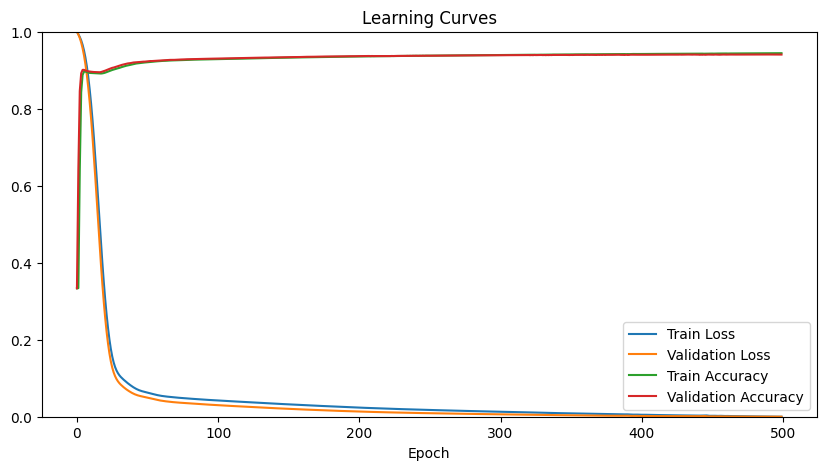

In [ ]:
plot_learning_curves(
    sage_loss,
    sage_accuracy,
    sage_val_loss,
    sage_val_accuracy)

In [ ]:
test_model(sage_model, X_test, y_test, test_edge_index, 'na')

{'accuracy': 0.9398442741263291,
 'precision': 0.9399910094508461,
 'recall': 0.9398442741263291,
 'f1_score': 0.9398229821949999,
 'predictions': tensor([0, 0, 0,  ..., 2, 2, 2], device='cuda:0')}

## GatedGNN

In [ ]:
model = GatedGNN(
    hidden_dim=400,
    num_classes=num_classes,
    num_layers=1)

(ggnn_model,
 ggnn_losses,
 ggnn_accuracies,
 ggnn_val_losses,
 ggnn_val_accuracies,
 ggnn_time,
 ggnn_mem) = train_model(
    model,
    X_train,
    y_train,
    train_edge_index,
    X_val,
    y_val,
    val_edge_index,
    num_epochs=500,
    learning_rate=1e-3,
    print_res=True,
    log_interval=200)

Epoch 000, Train Loss: 1.0983, Train Acc: 0.4452, Val Loss: 1.0954, Val Acc: 0.5952, Epoch Time: 0.49s, Peak Memory Usage: 12374.41MB
Epoch 200, Train Loss: 0.2088, Train Acc: 0.9269, Val Loss: 0.2055, Val Acc: 0.9288, Epoch Time: 0.52s, Peak Memory Usage: 12394.20MB
Epoch 400, Train Loss: 0.1976, Train Acc: 0.9297, Val Loss: 0.1949, Val Acc: 0.9307, Epoch Time: 0.52s, Peak Memory Usage: 12394.20MB
Total Training Time: 257.76s
Average Peak Memory Usage per Epoch: 12394.27MB


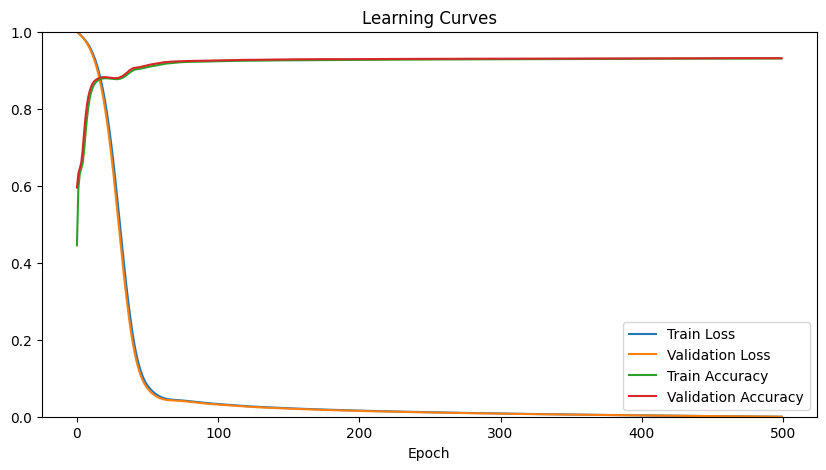

In [ ]:
plot_learning_curves(
    ggnn_losses,
    ggnn_accuracies,
    ggnn_val_losses,
    ggnn_val_accuracies)

In [ ]:
test_model(ggnn_model, X_test, y_test, test_edge_index, 'na')

({'accuracy': 0.9313464392445465,
  'precision': 0.9315451483312777,
  'recall': 0.9313464392445465,
  'f1_score': 0.9313789167406805,
  'predictions': tensor([0, 0, 0,  ..., 2, 2, 2], device='cuda:0')},)

## GCN

In [ ]:
model = GCN(
  data.num_nodes,
  256,)

(gcn_model,
 gcn_losses,
 gcn_accuracies,
 gcn_val_losses,
 gcn_val_accuracies,
 gcn_time,
 gcn_mem) = train_model(
    model,
    X_train,
    y_train,
    train_edge_index,
    X_val,
    y_val,
    val_edge_index,
    num_epochs=500,
    learning_rate=1e-3,
    print_res=True,
    log_interval=200)

Epoch 000, Train Loss: 1.0969, Train Acc: 0.3333, Val Loss: 1.0823, Val Acc: 0.4029, Epoch Time: 0.09s, Peak Memory Usage: 1601.16MB
Epoch 200, Train Loss: 0.1757, Train Acc: 0.9347, Val Loss: 0.1742, Val Acc: 0.9360, Epoch Time: 0.09s, Peak Memory Usage: 1608.18MB
Epoch 400, Train Loss: 0.1581, Train Acc: 0.9414, Val Loss: 0.1627, Val Acc: 0.9406, Epoch Time: 0.09s, Peak Memory Usage: 1608.18MB
Total Training Time: 44.40s
Average Peak Memory Usage per Epoch: 1607.99MB


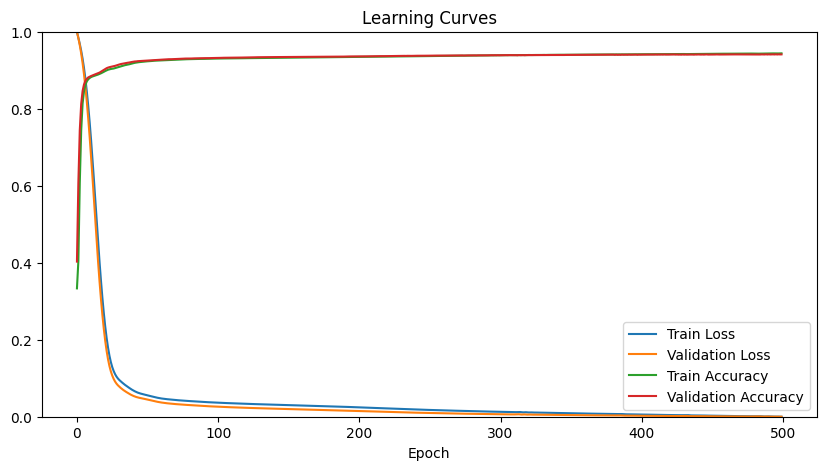

In [ ]:
plot_learning_curves(
    gcn_losses,
    gcn_accuracies,
    gcn_val_losses,
    gcn_val_accuracies)

In [ ]:
test_model(gcn_model, X_test, y_test, test_edge_index, 'na')

({'accuracy': 0.93966130638964,
  'precision': 0.9398215970545518,
  'recall': 0.93966130638964,
  'f1_score': 0.9396556118267403,
  'predictions': tensor([0, 0, 0,  ..., 2, 2, 2], device='cuda:0')},)

## GIN

In [ ]:
nn = Sequential(
    Linear(data.num_features['post'], 256),
    ReLU(),
    Linear(256, data.num_features['post']),)

model = GIN(
    nn,
    num_classes,
    out_channels=data.num_features['post'])

(gin_model,
 gin_losses,
 gin_accuracies,
 gin_val_losses,
 gin_val_accuracies,
 gin_time,
 gin_mem) = train_model(
    model,
    X_train,
    y_train,
    train_edge_index,
    X_val,
    y_val,
    val_edge_index,
    num_epochs=500,
    print_res=True,
    learning_rate=1e-4,
    log_interval=200)

Epoch 000, Train Loss: 1.0997, Train Acc: 0.3334, Val Loss: 1.0993, Val Acc: 0.3335, Epoch Time: 0.13s, Peak Memory Usage: 2919.22MB
Epoch 200, Train Loss: 0.2512, Train Acc: 0.9120, Val Loss: 0.2316, Val Acc: 0.9153, Epoch Time: 0.14s, Peak Memory Usage: 2923.62MB
Epoch 400, Train Loss: 0.1971, Train Acc: 0.9273, Val Loss: 0.1921, Val Acc: 0.9290, Epoch Time: 0.13s, Peak Memory Usage: 2923.62MB
Total Training Time: 67.46s
Average Peak Memory Usage per Epoch: 2923.68MB


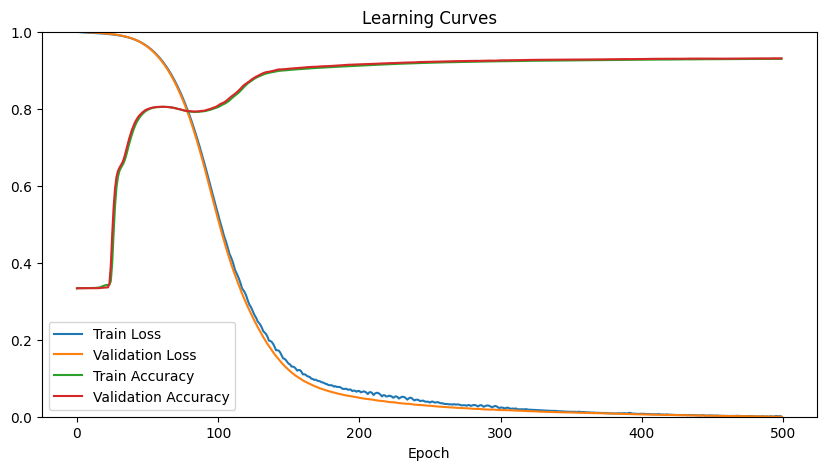

In [ ]:
plot_learning_curves(
    gin_losses,
    gin_accuracies,
    gin_val_losses,
    gin_val_accuracies,)

In [ ]:
test_model(gin_model, X_test, y_test, test_edge_index, 'na')

({'accuracy': 0.930228303075891,
  'precision': 0.9304838421248616,
  'recall': 0.930228303075891,
  'f1_score': 0.9303116322005717,
  'predictions': tensor([0, 0, 0,  ..., 2, 2, 2], device='cuda:0')},)

## Test Against Evaluation Metrics

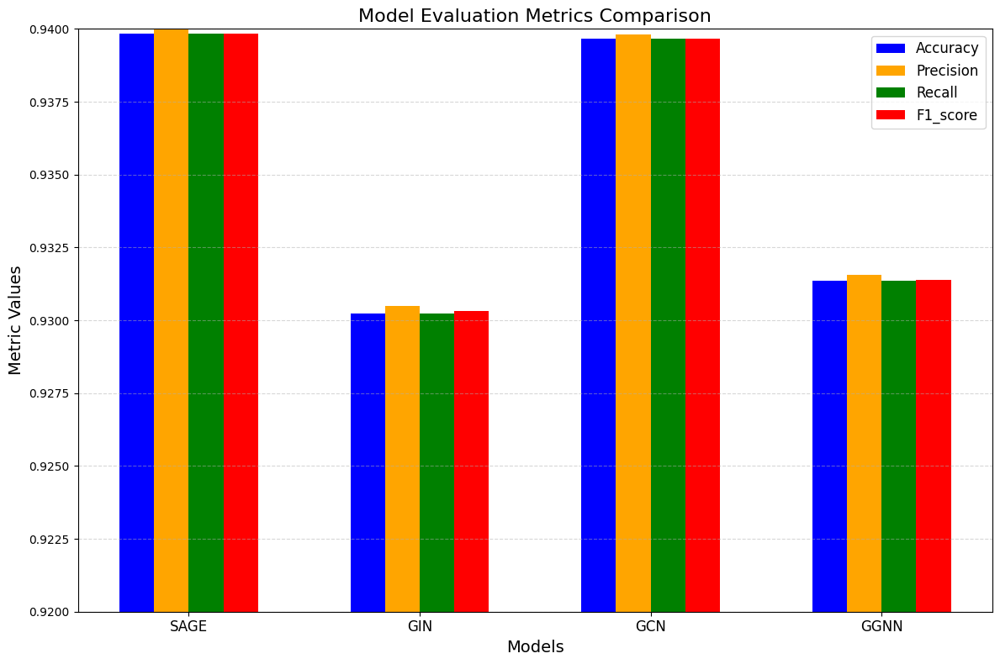

In [ ]:
model_names = ["SAGE", "GIN", "GCN", "GGNN"]
test_results = [
    test_model(sage_model, X_test, y_test, test_edge_index, 'na'),
    test_model(gin_model, X_test, y_test, test_edge_index, 'na'),
    test_model(gcn_model, X_test, y_test, test_edge_index, 'na'),
    test_model(ggnn_model, X_test, y_test, test_edge_index, 'na'),
]

metrics = ['accuracy', 'precision', 'recall', 'f1_score']
results = {metric: [] for metric in metrics}

# extract metrics for each model
for model_metrics in test_results:
    for metric in metrics:
        results[metric].append(model_metrics.get(metric, None))

# grouped bar chart
x = np.arange(len(model_names))  # x-axis positions for models
bar_width = 0.15  # width of each bar
colors = ['blue', 'orange', 'green', 'red', 'purple']

plt.figure(figsize=(12, 8))

for i, metric in enumerate(metrics):
    plt.bar(x + i * bar_width, results[metric], bar_width, label=metric.capitalize(), color=colors[i])

# configure plot
plt.xlabel('Models', fontsize=14)
plt.ylabel('Metric Values', fontsize=14)
plt.title('Model Evaluation Metrics Comparison', fontsize=16)
plt.xticks(x + (len(metrics) - 1) * bar_width / 2, model_names, fontsize=12)
plt.legend(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.ylim(0.92, 0.94)
plt.tight_layout()

plt.show()

In [ ]:
for res in test_results:
    print(res)
    print()

{'accuracy': 0.9398442741263291, 'precision': 0.9399910094508461, 'recall': 0.9398442741263291, 'f1_score': 0.9398229821949999, 'predictions': tensor([0, 0, 0,  ..., 2, 2, 2], device='cuda:0')}

{'accuracy': 0.930228303075891, 'precision': 0.9304838421248616, 'recall': 0.930228303075891, 'f1_score': 0.9303116322005717, 'predictions': tensor([0, 0, 0,  ..., 2, 2, 2], device='cuda:0')}

{'accuracy': 0.93966130638964, 'precision': 0.9398215970545518, 'recall': 0.93966130638964, 'f1_score': 0.9396556118267403, 'predictions': tensor([0, 0, 0,  ..., 2, 2, 2], device='cuda:0')}

{'accuracy': 0.9313464392445465, 'precision': 0.9315451483312777, 'recall': 0.9313464392445465, 'f1_score': 0.9313789167406805, 'predictions': tensor([0, 0, 0,  ..., 2, 2, 2], device='cuda:0')}



## Computation Time & Memory Use

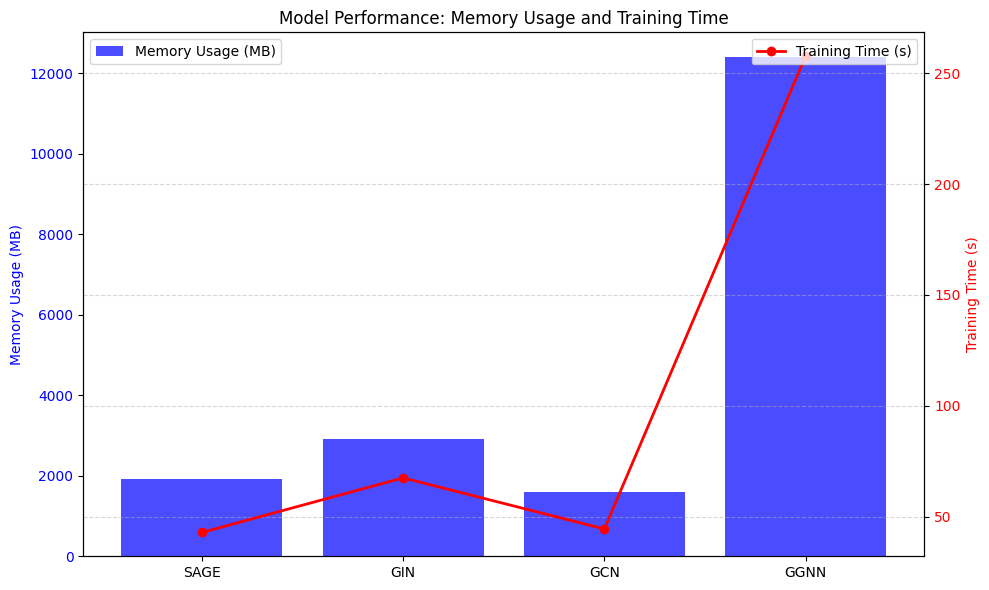

In [ ]:
model_names = ["SAGE", "GIN", "GCN", "GGNN"]
memory_usages = [sage_mem, gin_mem, gcn_mem, ggnn_mem]
training_times = [sage_time, gin_time, gcn_time, ggnn_time]

fig, ax1 = plt.subplots(figsize=(10, 6))

# plot memory usage
ax1.bar(model_names, memory_usages, alpha=0.7, label='Memory Usage (MB)', color='blue')
ax1.set_ylabel('Memory Usage (MB)', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# plot training time
ax2 = ax1.twinx()
ax2.plot(model_names, training_times, label='Training Time (s)', color='red', marker='o', linewidth=2)
ax2.set_ylabel('Training Time (s)', color='red')
ax2.tick_params(axis='y', labelcolor='red')

# titles and legend
plt.title('Model Performance: Memory Usage and Training Time')
fig.tight_layout()
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.show()

## Confusion Matrices

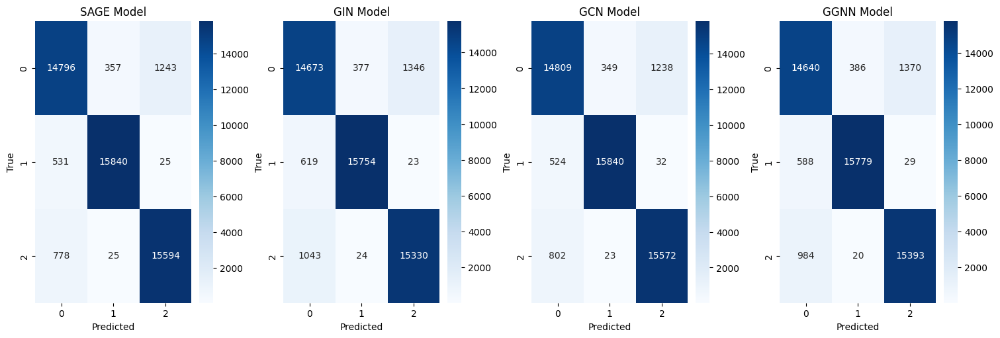

In [ ]:
model_names = ["SAGE", "GIN", "GCN", "GGNN"]
fig, axes = plt.subplots(
    1,
    len(model_names),
    figsize=(15, 5),
    constrained_layout=True)

# loop through models and plot confusion matrices
for i, (model, name) in enumerate(zip([sage_model, gin_model, gcn_model, ggnn_model], model_names)):
    res = test_model(
        model,
        X_test,
        y_test,
        test_edge_index
    )

    cm = confusion_matrix(y_test, res['predictions'].to('cpu').numpy())

    # plot confusion matrix on the respective subplot
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=True, yticklabels=True, ax=axes[i])
    axes[i].set_title(f"{name} Model")
    axes[i].set_xlabel("Predicted")
    axes[i].set_ylabel("True")


plt.show()

## Testing With Different Hyperparameters

In [ ]:
test_dict = {
     GraphSAGE: {
         'agrr': ['max', 'sum'],
         'out_channels': [32, 512],
     },
     GCN: {
         'out_channels': [32, 128, 512],
     },
     GatedGNN: {
         'hidden_dim': [420, 460, 500],
         'num_layers': [1, 2, 3],
         'agrr': ['max', 'sum'],
     },
    GIN: {
        'eps': [0.1, 0.5, 1, 2],
    },
}

In [ ]:
def train_model(
    model,
    X_train,
    y_train,
    train_edge_index,
    X_val,
    y_val,
    val_edge_index,
    num_epochs=100,
    learning_rate=0.01,
    weight_decay=5e-4,
    log_interval=10,
    log_dir='./runs',
    param_name=None,
    param_value=None,
    print_res=False
):
    # construct a unique directory for TensorBoard logs
    run_name = f"{model.__class__.__name__}__{param_name}__{param_value}"
    writer = SummaryWriter(f"{log_dir}/{run_name}")

    # optimizer and loss function
    optimizer = torch.optim.Adam(
        model.parameters(),
        lr=learning_rate,
        weight_decay=weight_decay
    )
    criterion = torch.nn.CrossEntropyLoss()

    # specify computation device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    X_train, y_train, train_edge_index = X_train.to(device), y_train.to(device), train_edge_index.to(device)
    X_val, y_val, val_edge_index = X_val.to(device), y_val.to(device), val_edge_index.to(device)
    model = model.to(device)

    # track progress
    train_losses, train_accuracies = [], []
    val_losses, val_accuracies = [], []

    for epoch in range(num_epochs):
        # training phase
        model.train()
        optimizer.zero_grad()
        data = {'post': {'x': X_train, 'edge_index': train_edge_index}}
        out = model(data)
        loss = criterion(out, y_train)
        loss.backward()
        optimizer.step()
        train_losses.append(loss.item())

        # calculate training accuracy
        pred = out.argmax(dim=1)
        train_acc = (pred == y_train).float().mean().item()
        train_accuracies.append(train_acc)

        # validation phase
        model.eval()
        with torch.no_grad():
            val_out = model({'post': {'x': X_val, 'edge_index': val_edge_index}})
            val_loss = criterion(val_out, y_val)
            val_losses.append(val_loss.item())
            val_pred = val_out.argmax(dim=1)
            val_acc = (val_pred == y_val).float().mean().item()
            val_accuracies.append(val_acc)

        # log learning curves
        writer.add_scalar('Loss/Train', train_losses[-1], epoch)
        writer.add_scalar('Loss/Validation', val_losses[-1], epoch)
        writer.add_scalar('Accuracy/Train', train_accuracies[-1], epoch)
        writer.add_scalar('Accuracy/Validation', val_accuracies[-1], epoch)

        # print results
        if print_res and epoch % log_interval == 0:
            print(
                f"Epoch {epoch:03d}, "
                f"Train Loss: {train_losses[-1]:.4f}, Train Acc: {train_accuracies[-1]:.4f}, "
                f"Val Loss: {val_losses[-1]:.4f}, Val Acc: {val_accuracies[-1]:.4f}"
            )

    writer.close()
    return model, train_losses, train_accuracies, val_losses, val_accuracies

In [ ]:
def test_hyperparams():
    for model, params in test_dict.items():
        for param_name, param_values in params.items():
            for value in param_values:
                print('\n')
                print("===============================================================")
                print(f"Testing {model.__name__} with {param_name}={value}")
                print("===============================================================")
                print('\n')

                if model == GraphSAGE:
                    target_model = GraphSAGE(
                        num_classes=num_classes,
                        out_channels=value if param_name == 'out_channels' else 256,
                        aggr=value if param_name == 'agrr' else 'mean',
                        bias=value if param_name == 'bias' else False)
                elif model == GCN:
                    target_model = GCN(
                        data.num_nodes,
                        value if param_name == 'out_channels' else 256)
                elif model == GatedGNN:
                    target_model = GatedGNN(
                        hidden_dim=value if param_name == 'hidden_dim' else 400,
                        num_classes=num_classes,
                        num_layers=value if param_name == 'num_layers' else 1,)
                elif model == GIN:
                    target_model = GIN(
                        nn=Sequential(
                            Linear(data.num_features['post'], 256),
                            ReLU(),
                            Linear(256, data.num_features['post'])),
                        num_classes=num_classes,
                        out_channels=384,
                        eps=value if param_name == 'eps' else 0,)

                trained_model, *_ = train_model(
                    target_model,
                    X_train,
                    y_train,
                    train_edge_index,
                    X_val,
                    y_val,
                    val_edge_index,
                    num_epochs=100,
                    log_dir='./runs/hyperparams',
                    param_name=param_name,
                    param_value=value,
                    print_res=True
                )

                # testing
                test_metrics = test_model(
                    trained_model,
                    X_test,
                    y_test,
                    test_edge_index,
                    log_dir='./runs/hyperparams'
                )
                writer = SummaryWriter(f"./runs/hyperparams/{target_model.__class__.__name__}__{param_name}__{value}")
                writer.add_scalar('Test/Accuracy', test_metrics['accuracy'])
                writer.add_scalar('Test/Precision', test_metrics['precision'])
                writer.add_scalar('Test/Recall', test_metrics['recall'])
                writer.add_scalar('Test/F1 Score', test_metrics['f1_score'])
                writer.close()

In [ ]:
test_hyperparams()



Testing GIN with eps=0.1


Epoch 000, Train Loss: 1.0988, Train Acc: 0.3289, Val Loss: 1.0910, Val Acc: 0.3333
Epoch 010, Train Loss: 0.3192, Train Acc: 0.9101, Val Loss: 0.2488, Val Acc: 0.9183
Epoch 020, Train Loss: 0.2082, Train Acc: 0.9246, Val Loss: 0.1989, Val Acc: 0.9268
Epoch 030, Train Loss: 0.1866, Train Acc: 0.9296, Val Loss: 0.1830, Val Acc: 0.9307
Epoch 040, Train Loss: 0.1769, Train Acc: 0.9336, Val Loss: 0.1750, Val Acc: 0.9349
Epoch 050, Train Loss: 0.1784, Train Acc: 0.9325, Val Loss: 0.1734, Val Acc: 0.9350
Epoch 060, Train Loss: 0.1780, Train Acc: 0.9358, Val Loss: 0.1761, Val Acc: 0.9346
Epoch 070, Train Loss: 0.1648, Train Acc: 0.9386, Val Loss: 0.1647, Val Acc: 0.9384
Epoch 080, Train Loss: 0.1721, Train Acc: 0.9371, Val Loss: 0.1754, Val Acc: 0.9366
Epoch 090, Train Loss: 0.1556, Train Acc: 0.9424, Val Loss: 0.1677, Val Acc: 0.9373


Testing GIN with eps=0.5


Epoch 000, Train Loss: 1.0987, Train Acc: 0.3323, Val Loss: 1.0752, Val Acc: 0.3333
Epoch 010, Train L

In [ ]:
!cp -r ./runs /content/drive/My\ Drive/ANN

In [ ]:
!cp -r /content/drive/My\ Drive/ANN/runs ./

In [ ]:
log_dir = "runs"
%load_ext tensorboard
%tensorboard --logdir {log_dir}

<IPython.core.display.Javascript object>